<a href="https://colab.research.google.com/github/barta3235/working_model_VGG19/blob/main/CF2_VGG19_20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from zipfile import ZipFile
import os,glob
import cv2
from tqdm._tqdm_notebook import tqdm_notebook as tqdm
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Convolution2D, Dropout, Dense,MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers import MaxPooling2D
from keras.layers import Flatten
import cv2
import matplotlib.pyplot as plt
!pip install lime
from lime.lime_image import LimeImageExplainer
import skimage.color as color
from skimage.segmentation import mark_boundaries
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.models import load_model
import cv2
from lime.lime_image import LimeImageExplainer

from google.colab import drive
drive.mount('/content/drive')

<ipython-input-3-f5183a5e5a06>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  from tqdm._tqdm_notebook import tqdm_notebook as tqdm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=3fd1abf02a4956beaadf5b9f4e87119707b14354833dabde01cc59b8689519f2
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
Mounted at /content/drive


LIME

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━

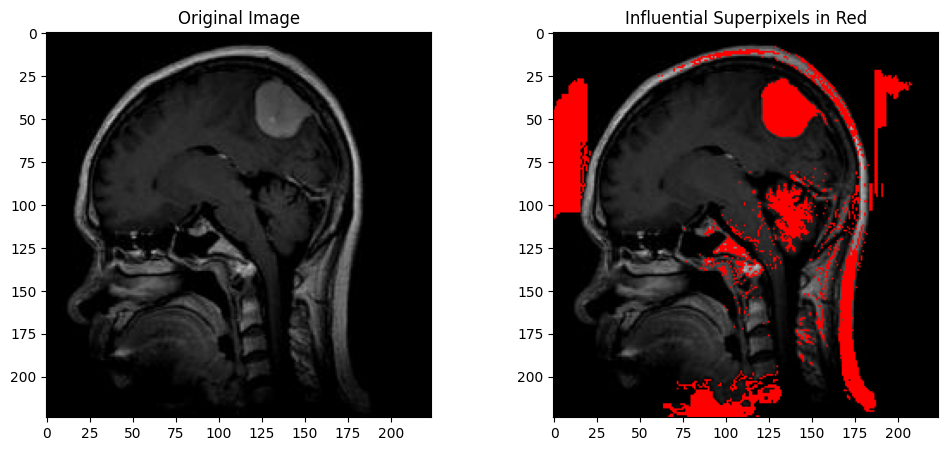

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (1).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step
Original Prediction: [[0.31361002 0.68639   ]]
Masked Prediction: [[0.502275   0.49772495]]


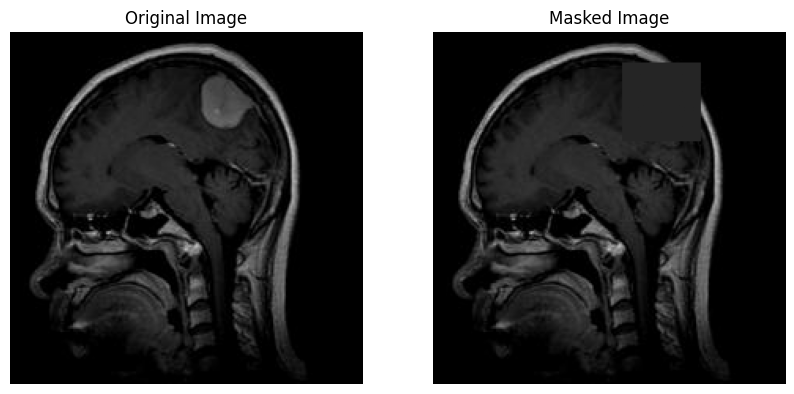

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(37/255.0, 37/255.0, 37/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (1).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(20,120  )]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━

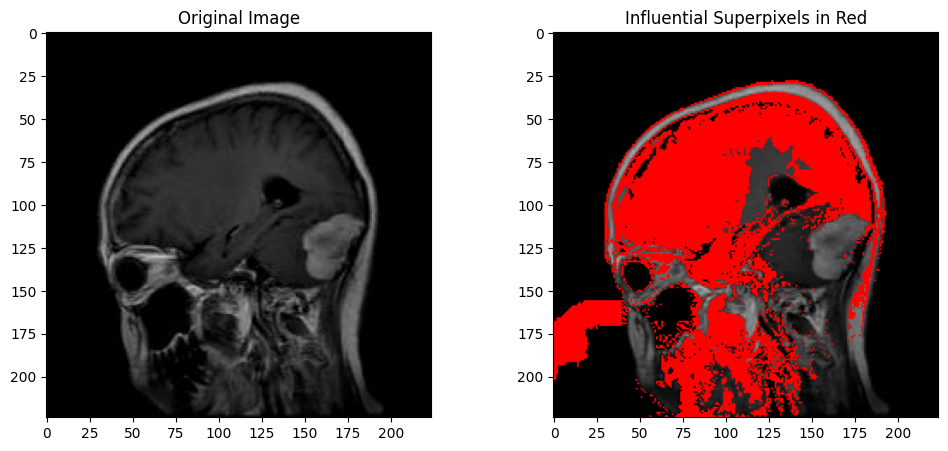

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (2).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  #Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
Original Prediction: [[0.4294866  0.57051337]]
Masked Prediction: [[0.5647053  0.43529472]]


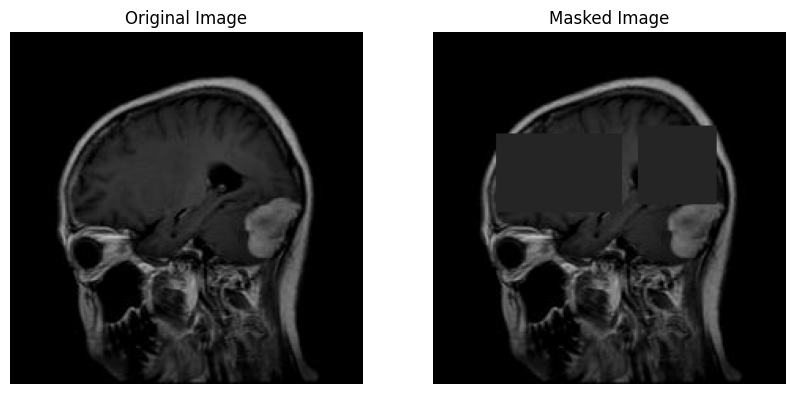

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(37/255.0, 37/255.0, 37/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (2).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(65,40),(60,130),(65,70)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━

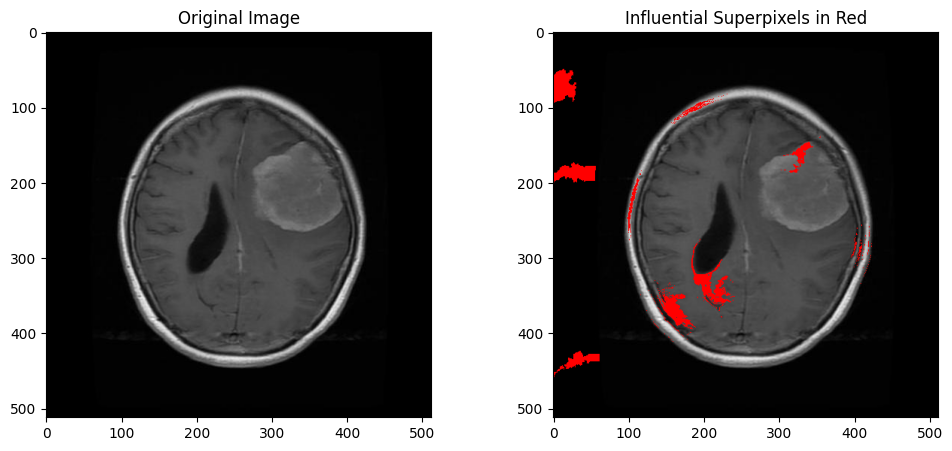

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (3).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 916ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
Original Prediction: [[0.18723935 0.8127606 ]]
Masked Prediction: [[0.4583745  0.54162544]]


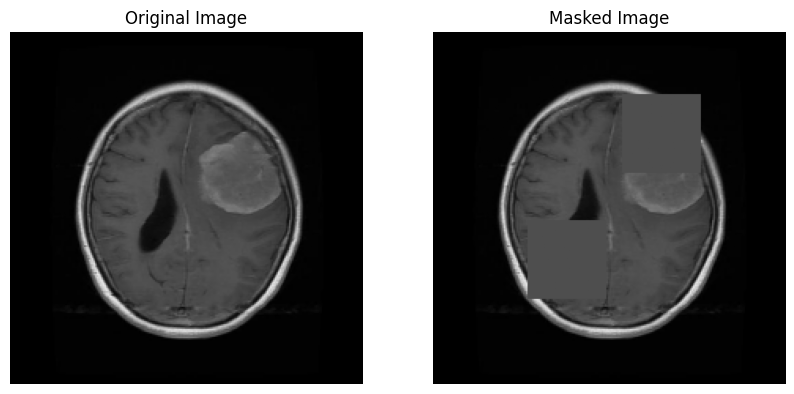

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(78/255.0, 78/255.0, 78/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (3).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(40,120),(120,60)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━

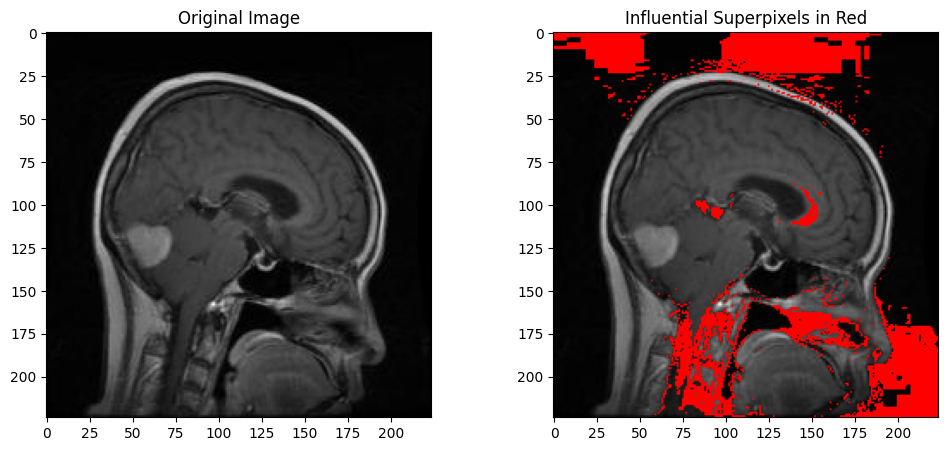

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (4).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
Original Prediction: [[0.13898964 0.8610104 ]]
Masked Prediction: [[0.14356638 0.85643363]]


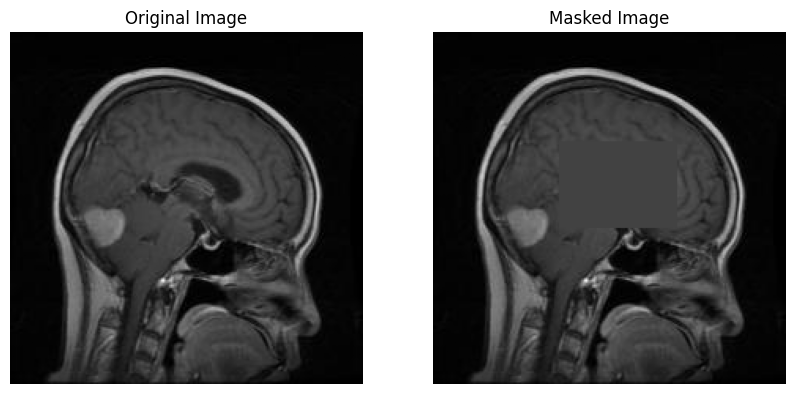

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(66/255.0, 66/255.0, 66/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (4).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(70,100),(70,80)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=55, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━

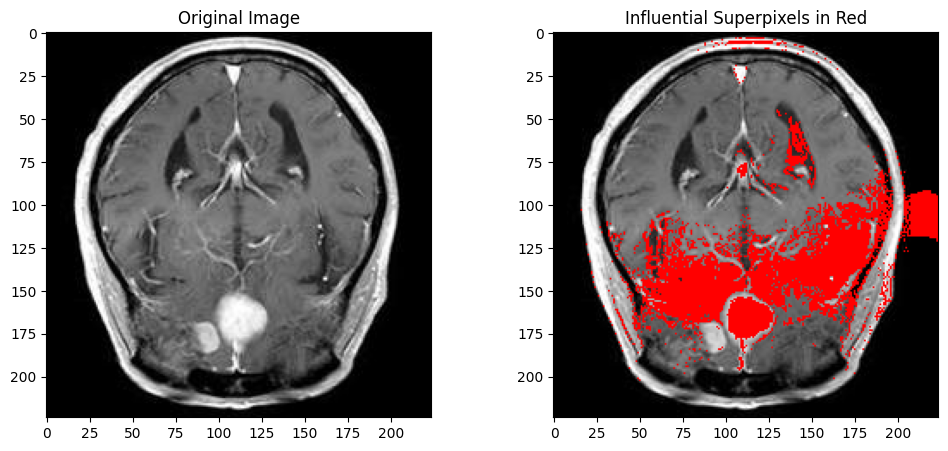

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (5).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
Original Prediction: [[0.08342725 0.9165728 ]]
Masked Prediction: [[0.2085057 0.7914943]]


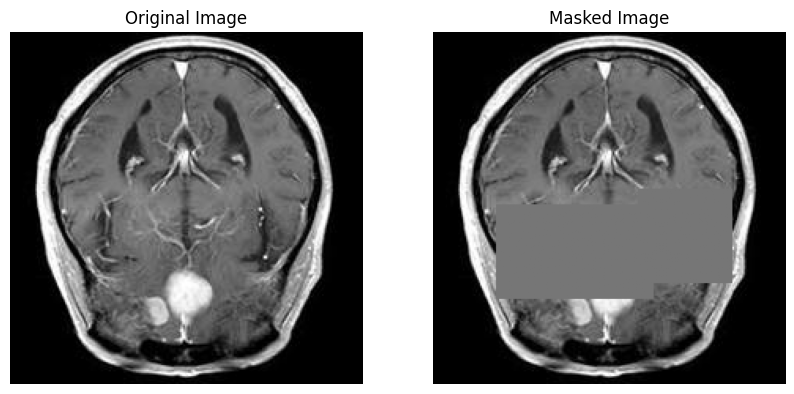

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(118/255.0, 118/255.0, 118/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (5).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(110,40),(100,130),(110,80)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=60, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━

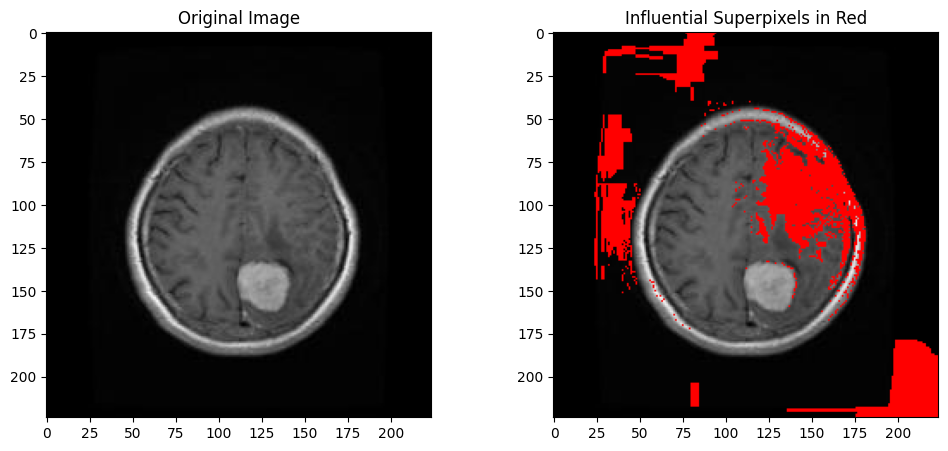

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (6).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 688ms/step
Original Prediction: [[0.12646341 0.8735365 ]]
Masked Prediction: [[0.15828237 0.8417176 ]]


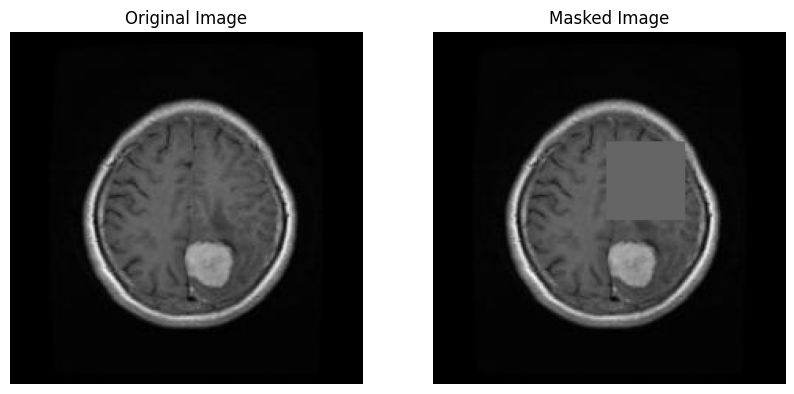

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(101/255.0, 101/255.0, 101/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (6).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(70,110)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7

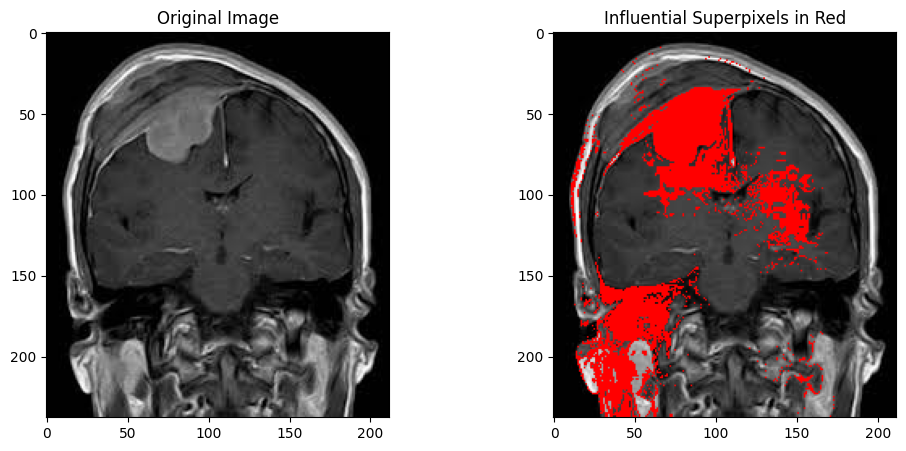

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (7).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step
Original Prediction: [[0.26643014 0.7335699 ]]
Masked Prediction: [[0.7898913  0.21010867]]


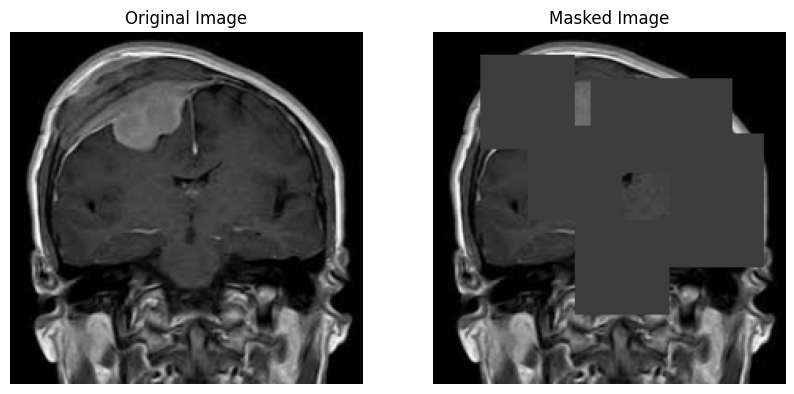

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(61/255.0, 61/255.0, 61/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (7).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(60,60),(30,100),(30,130),(65,150),(90,150),(120,90),(15,30)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=60, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()

  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 

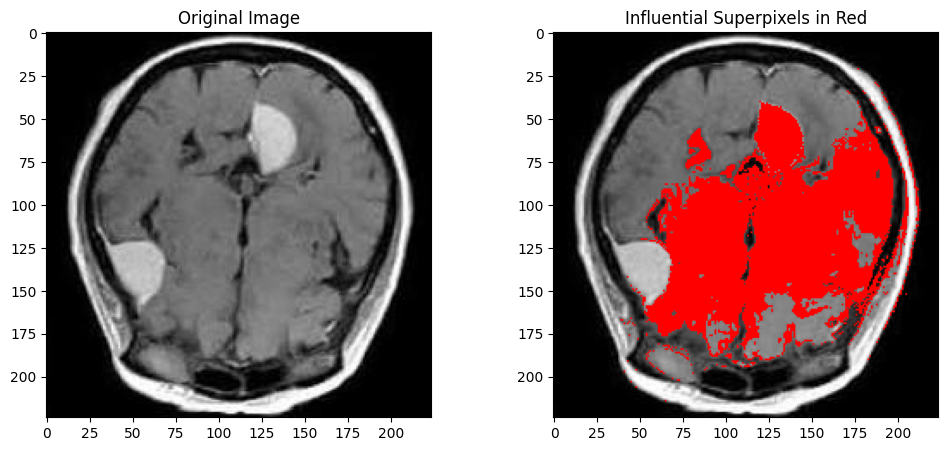

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (8).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
Original Prediction: [[0.17597021 0.82402974]]
Masked Prediction: [[0.5078618  0.49213818]]


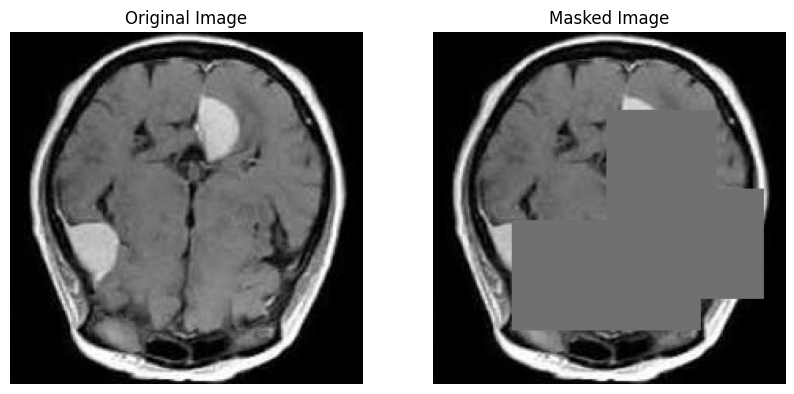

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(112/255.0, 112/255.0, 112/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (8).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(50,110),(120,50),(120,100),(100,140)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=70, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


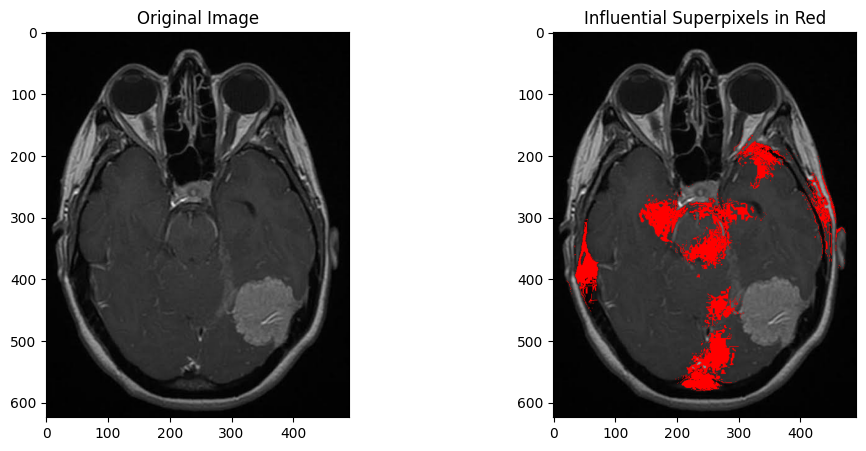

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (9).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.43774822 0.56225175]]
Masked Prediction: [[0.5090114 0.4909887]]


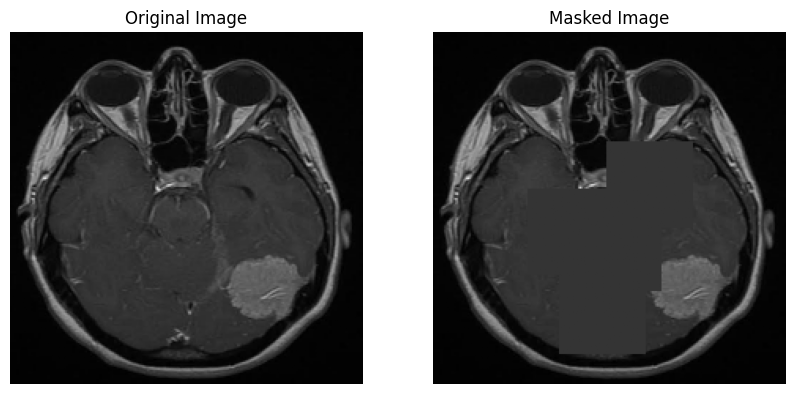

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(52/255.0, 52/255.0, 52/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (9).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(100,60),(110,90),(70,110),(150,80)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=55, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 

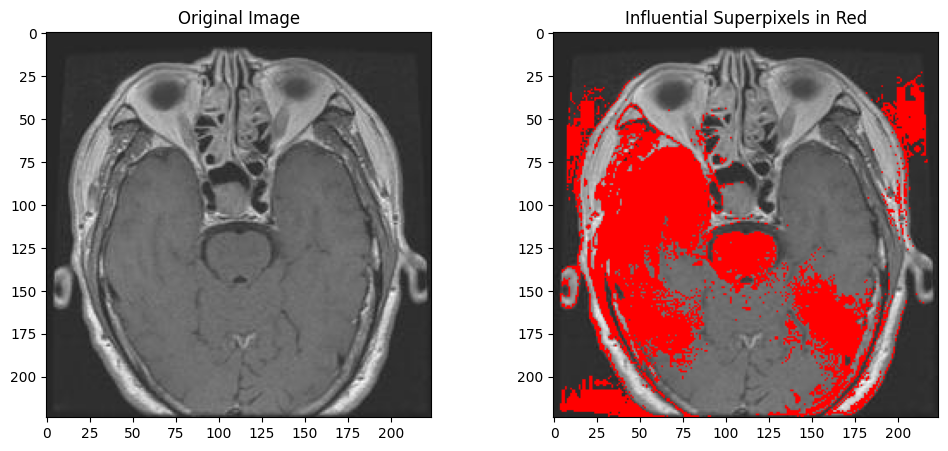

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (10).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.13399598 0.86600405]]
Masked Prediction: [[0.5282508  0.47174916]]


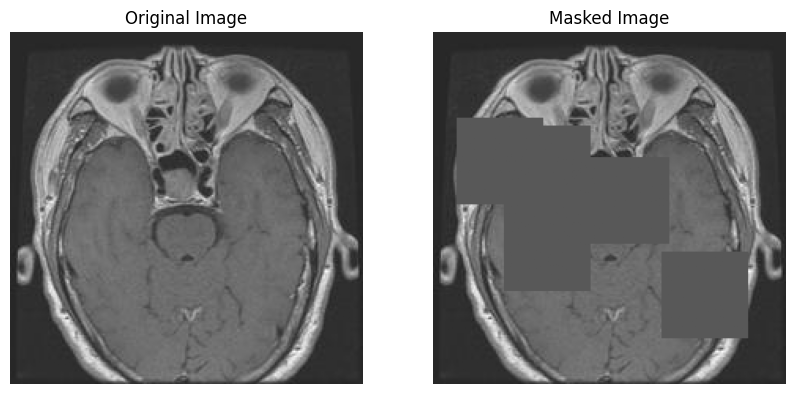

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(88/255.0, 88/255.0, 88/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (10).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(55,15),(60,45),(80,95),(110,45),(140,145)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=55, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

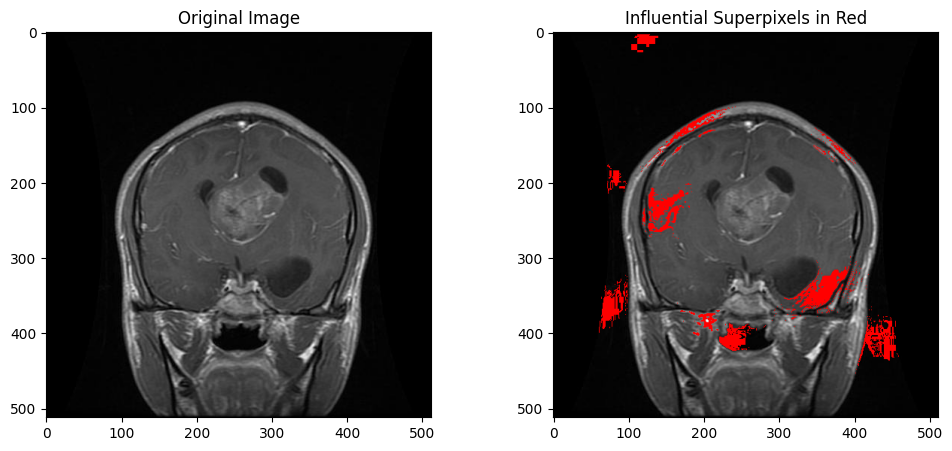

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (11).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Original Prediction: [[0.07840578 0.92159426]]
Masked Prediction: [[0.13157693 0.86842304]]


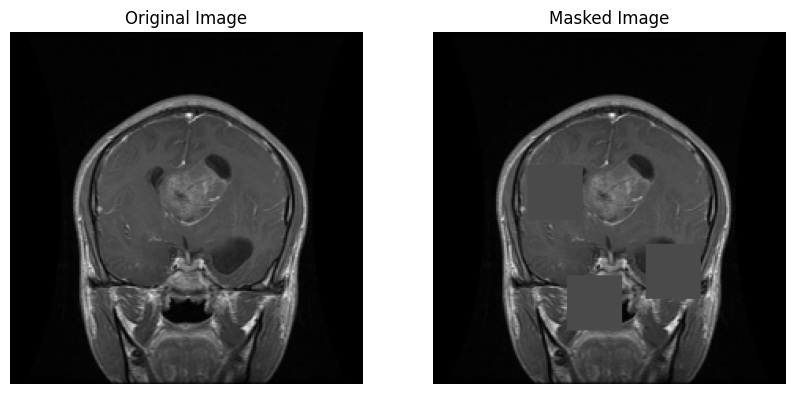

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(74/255.0, 74/255.0, 74/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (11).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(85,60),(155,85),(135,135)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=35, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 

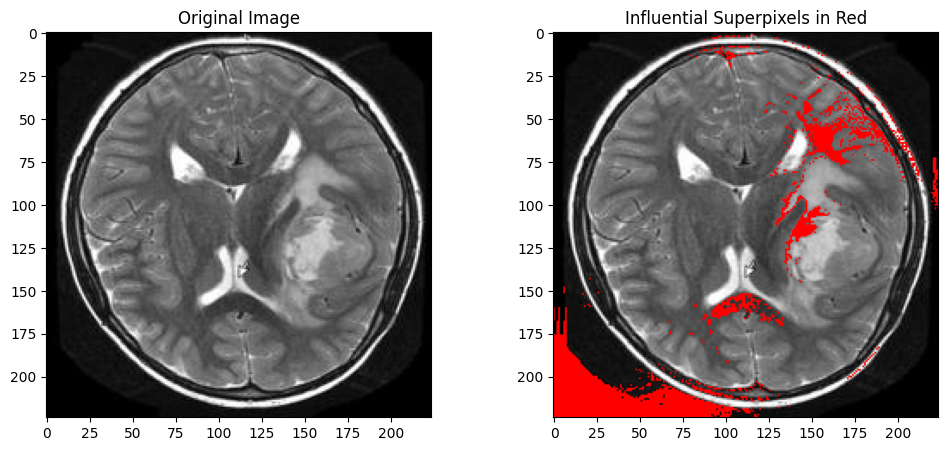

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (12).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 913ms/step
Original Prediction: [[0.41009596 0.589904  ]]
Masked Prediction: [[0.48602283 0.51397717]]


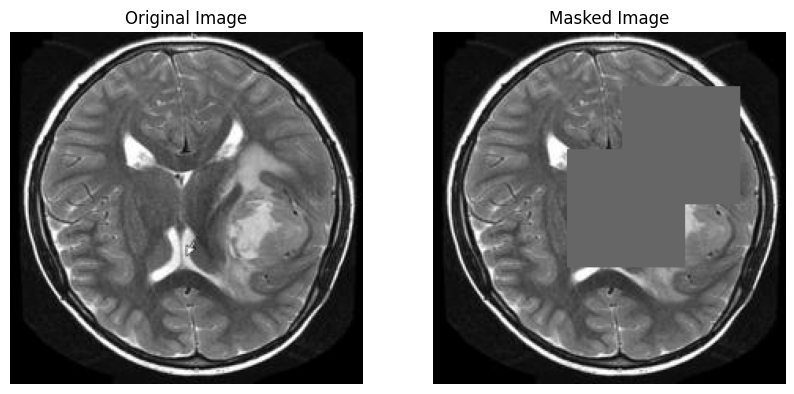

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(102/255.0, 102/255.0, 102/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (12).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(75,85),(35,120)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=75, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

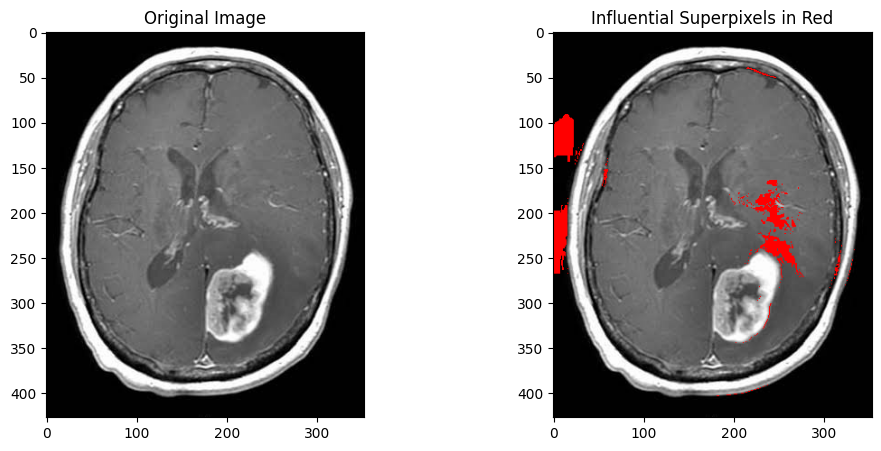

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (13).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.11408988 0.88591015]]
Masked Prediction: [[0.13575245 0.86424756]]


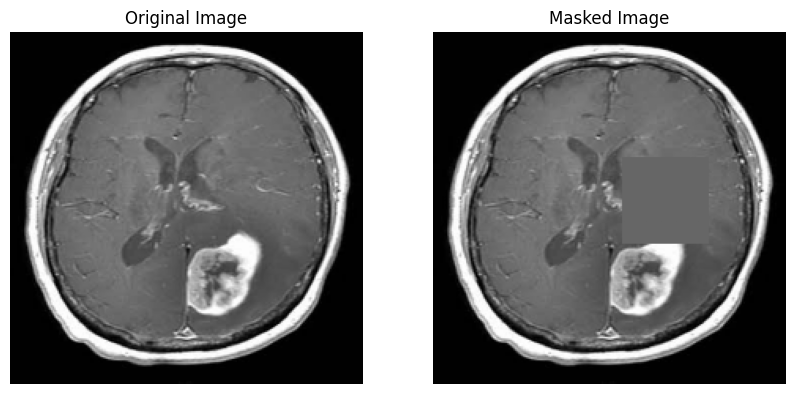

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(102/255.0, 102/255.0, 102/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (13).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(80,120)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=55, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

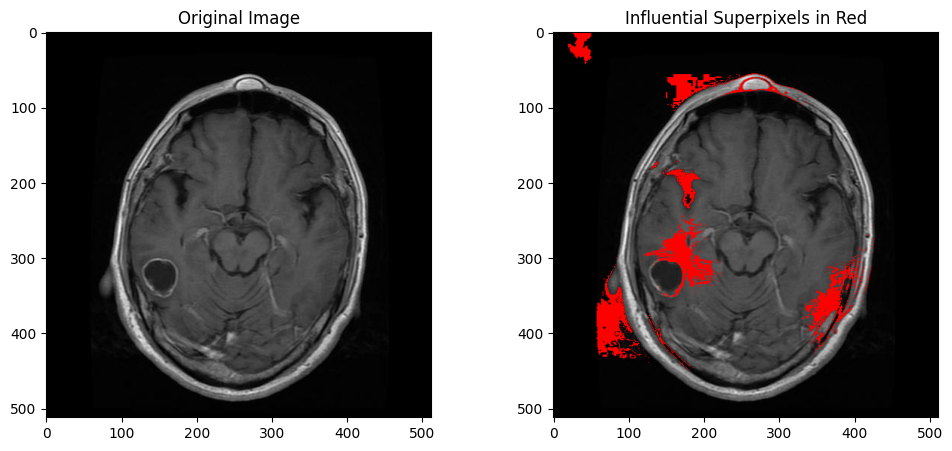

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (14).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.22764345 0.77235657]]
Masked Prediction: [[0.2897472  0.71025276]]


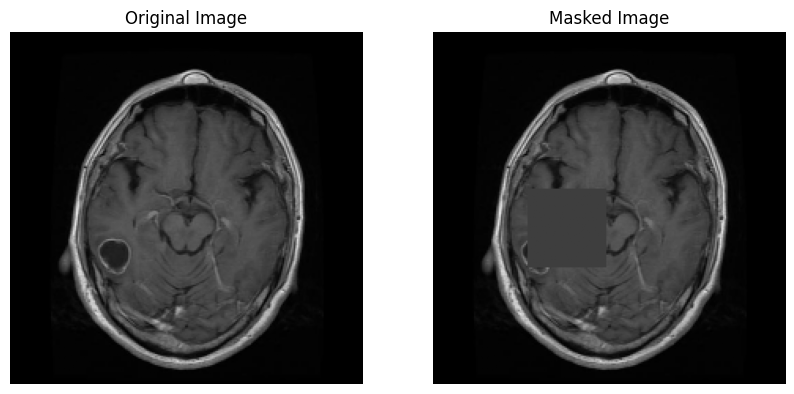

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(62/255.0, 62/255.0, 62/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (14).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(100,60)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

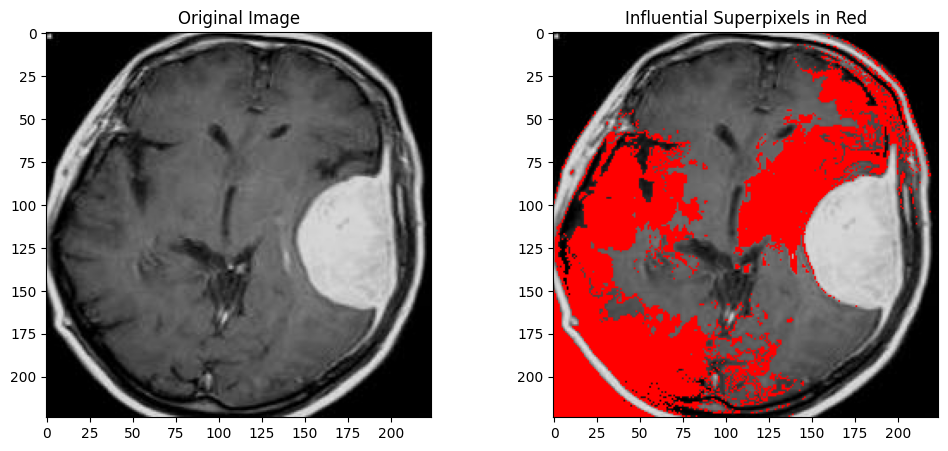

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (15).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Original Prediction: [[0.20310627 0.7968937 ]]
Masked Prediction: [[0.47229514 0.52770483]]


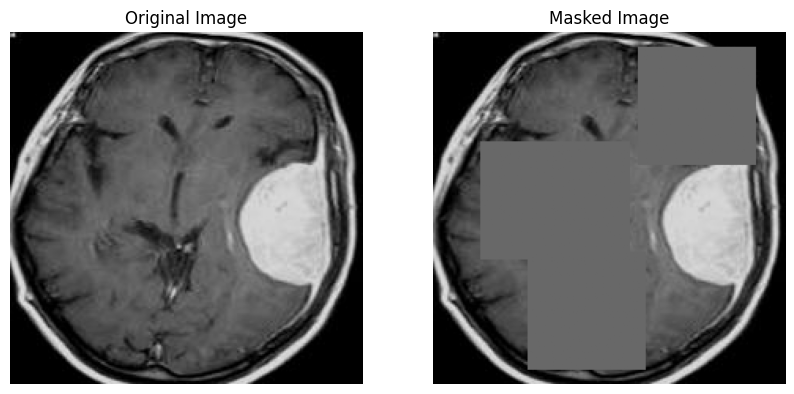

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(104/255.0, 104/255.0, 104/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (15).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(70,30),(70,50),(140,60),(10,130)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=75, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

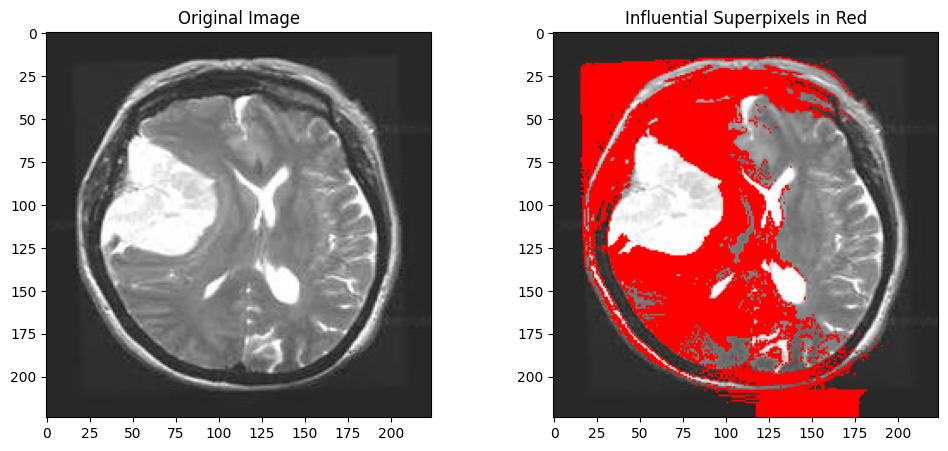

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (16).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 963ms/step
Original Prediction: [[0.30354846 0.6964515 ]]
Masked Prediction: [[0.33126643 0.66873354]]


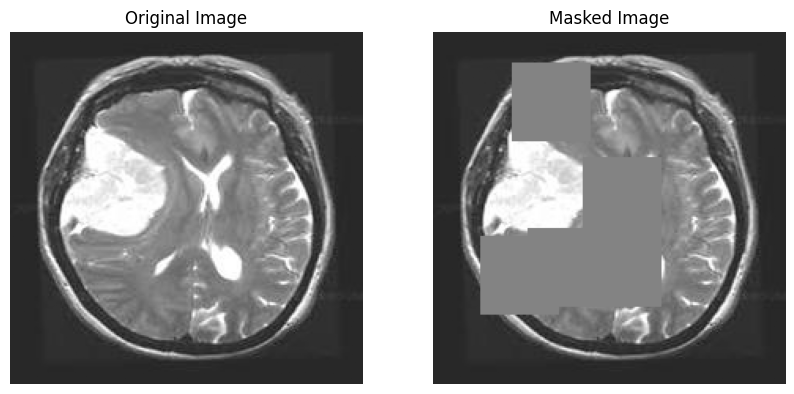

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(131/255.0, 131/255.0, 131/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (16).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(130,30),(125,60),(80,95),(125,95),(20,50)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

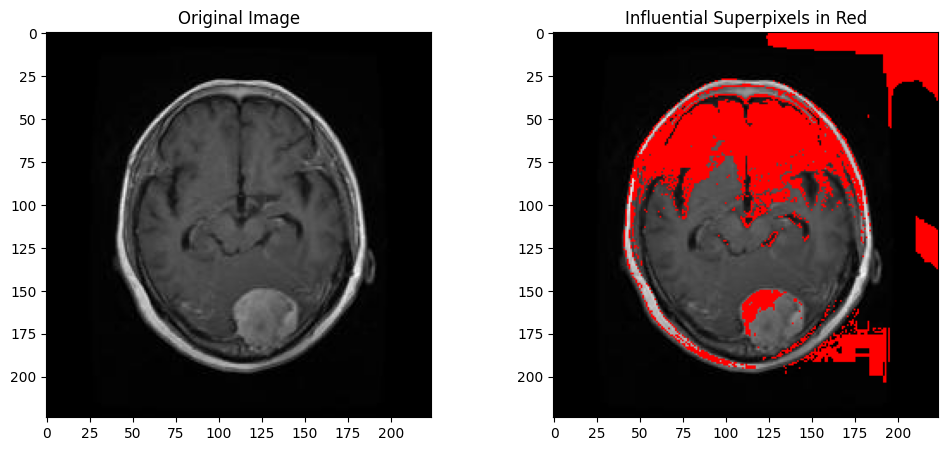

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (17).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.15730412 0.8426959 ]]
Masked Prediction: [[0.31420362 0.6857964 ]]


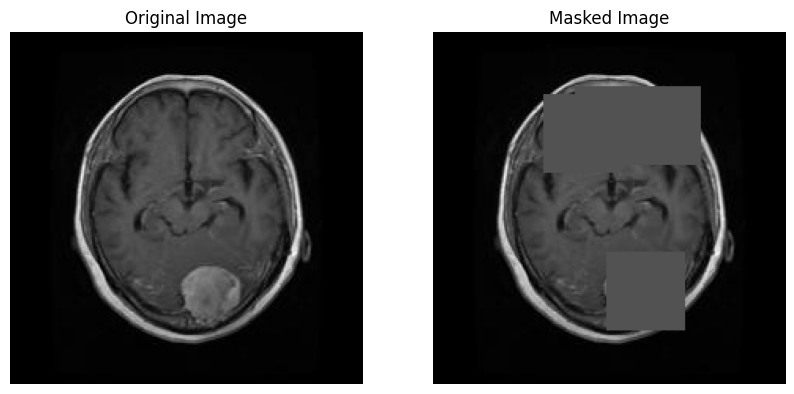

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(82/255.0, 82/255.0, 82/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (17).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(40,70),(35,90),(35,120),(140,110)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

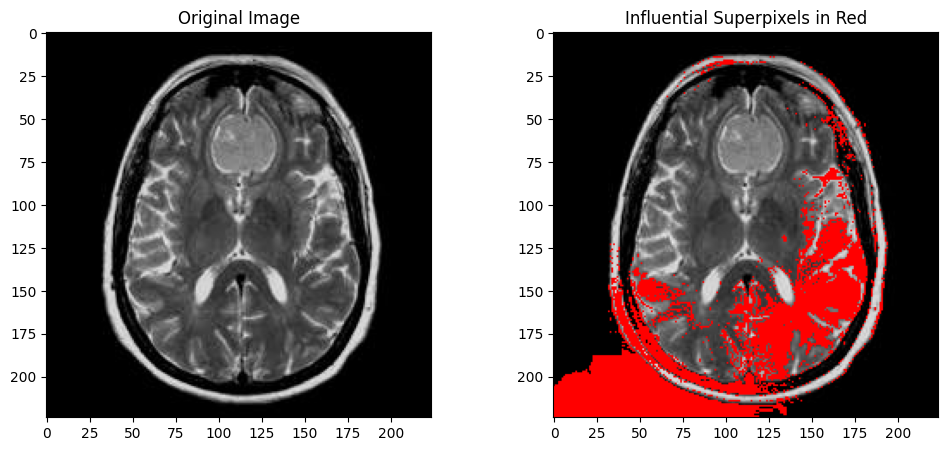

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (18).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.3308105 0.6691895]]
Masked Prediction: [[0.6291722  0.37082776]]


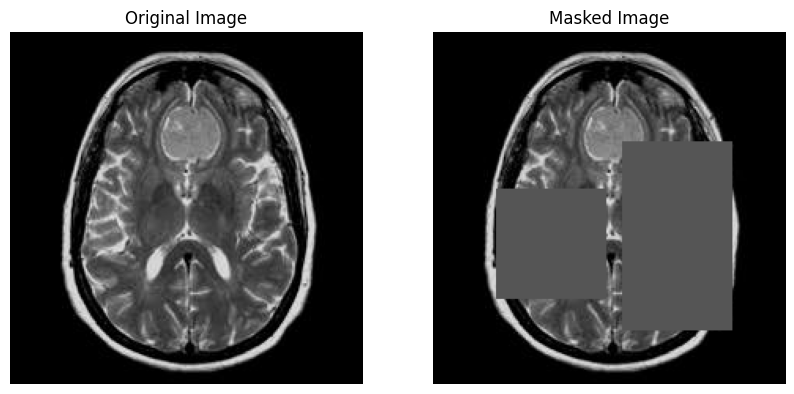

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(85/255.0, 85/255.0, 85/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (18).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(70,120),(100,40),(120,120)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=70, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

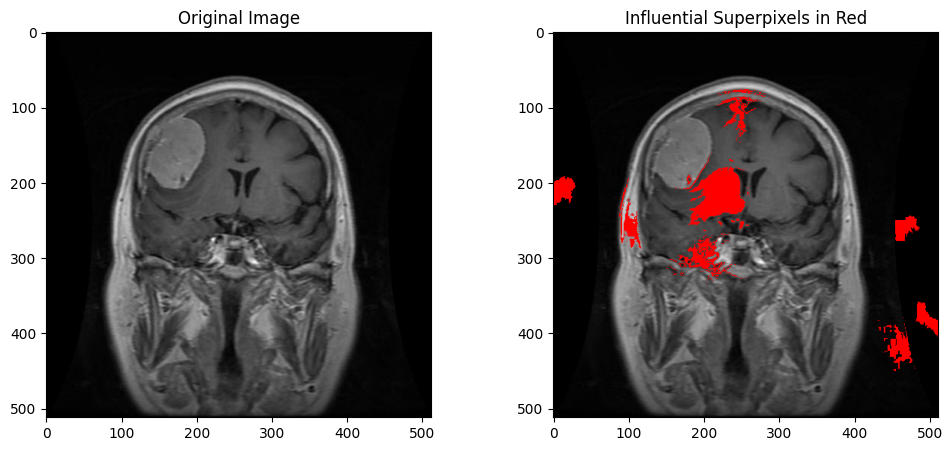

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (19).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step
Original Prediction: [[0.1996036 0.8003964]]
Masked Prediction: [[0.16648604 0.833514  ]]


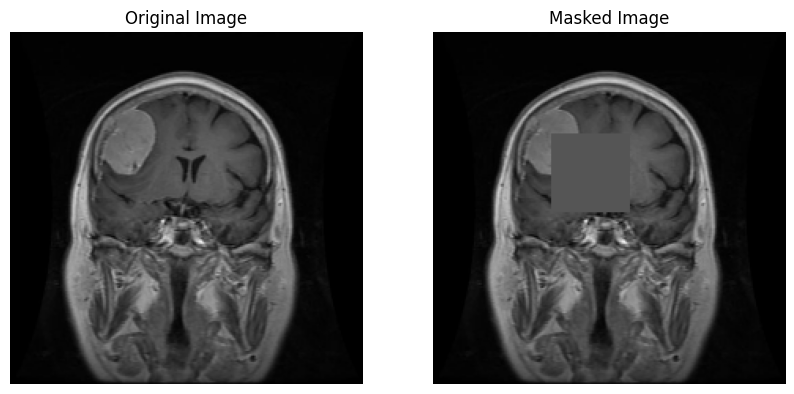

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(85/255.0, 85/255.0, 85/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (19).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(65,75)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

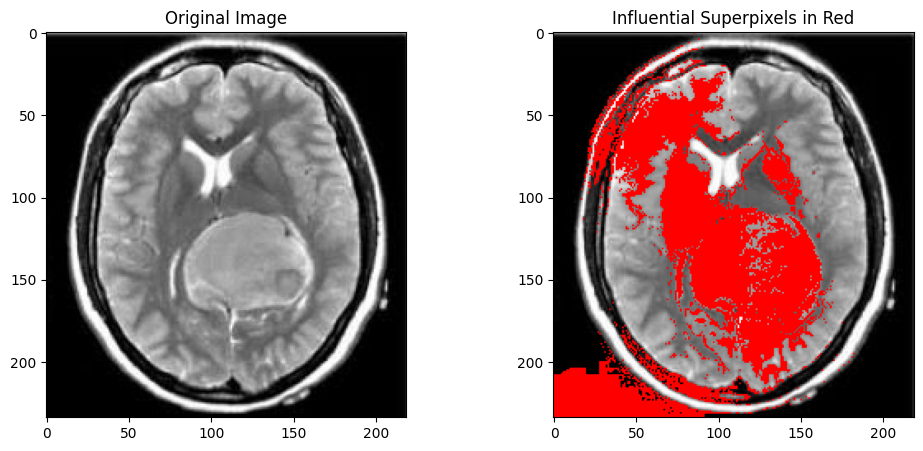

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (20).jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.1841616 0.8158384]]
Masked Prediction: [[0.26325157 0.73674834]]


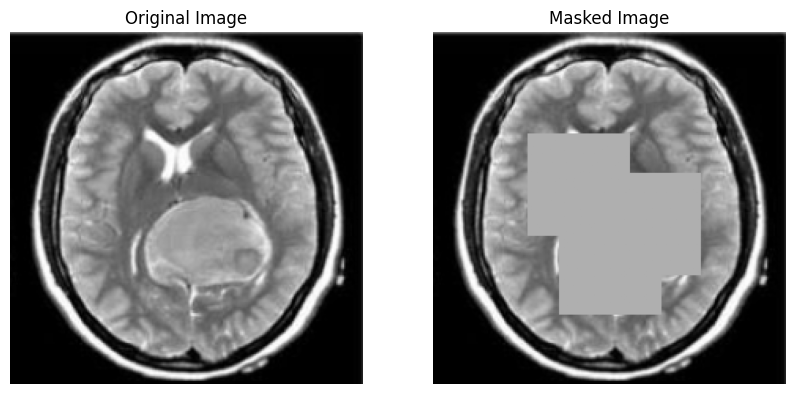

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(175/255.0, 175/255.0, 175/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/CF20 (20).jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(115,80),(90,105),(65,60)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=65, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

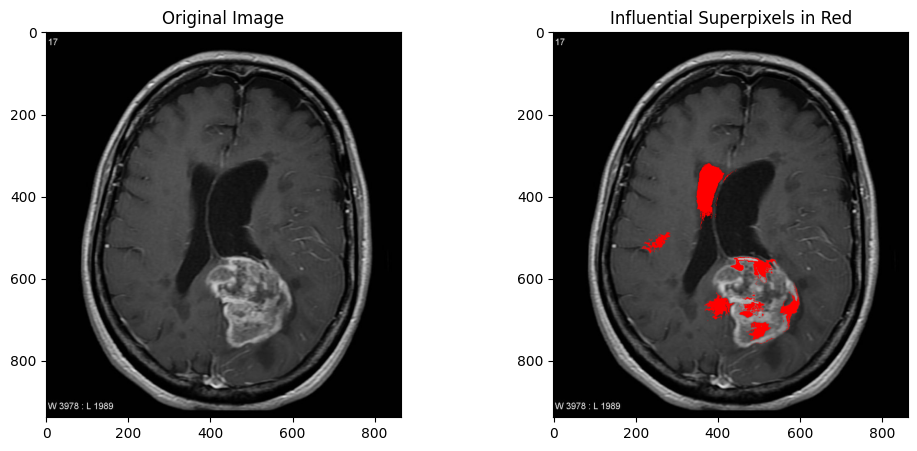

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last1of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.21322154 0.78677845]]
Masked Prediction: [[0.30445963 0.6955403 ]]


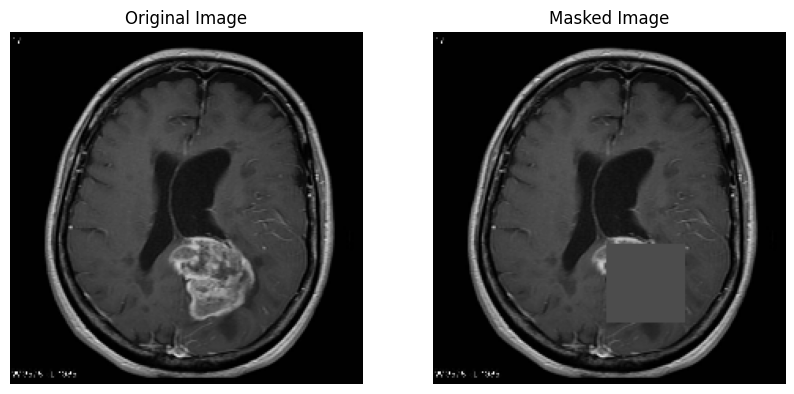

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(76/255.0, 76/255.0, 76/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last1of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(135,110)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 

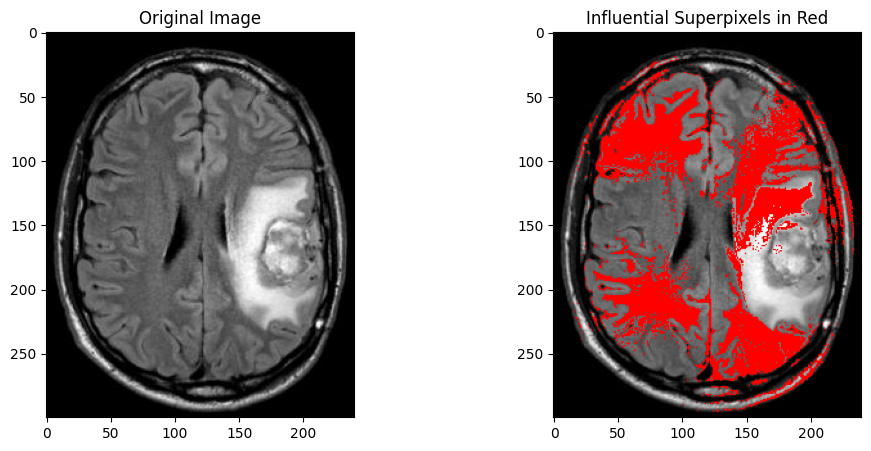

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last2of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.3711261 0.6288739]]
Masked Prediction: [[0.5456463  0.45435363]]


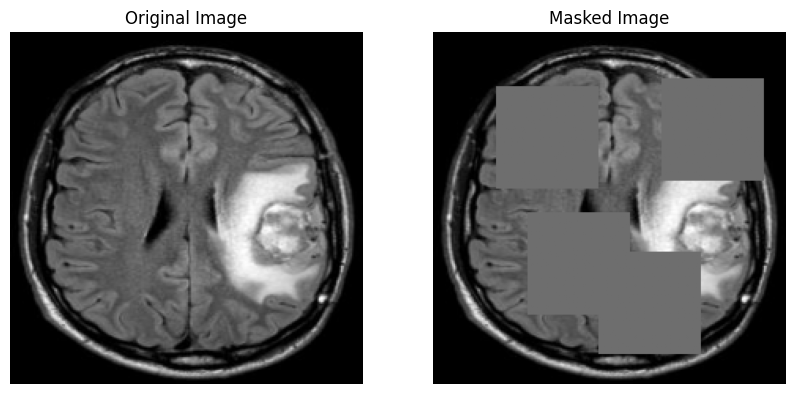

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(110/255.0, 110/255.0, 110/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last2of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(35,40),(115,60),(140,105),(30,145)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=65, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━

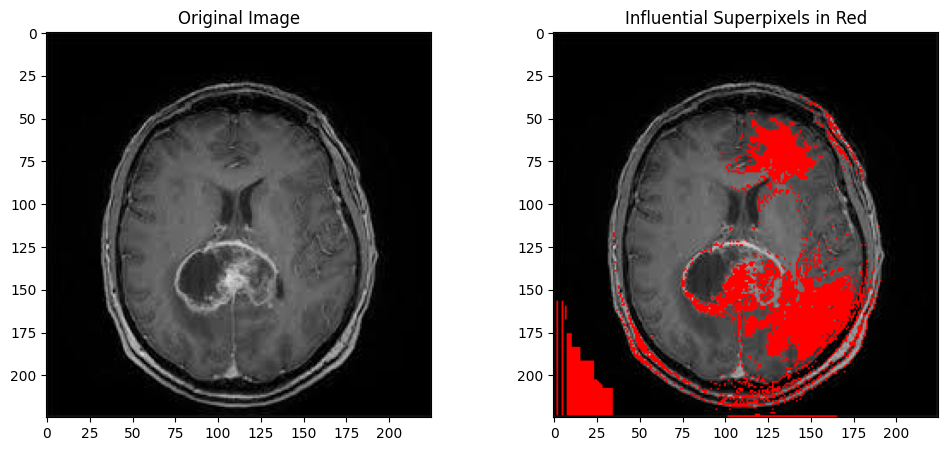

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last3of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.17452343 0.8254766 ]]
Masked Prediction: [[0.4553789 0.5446211]]


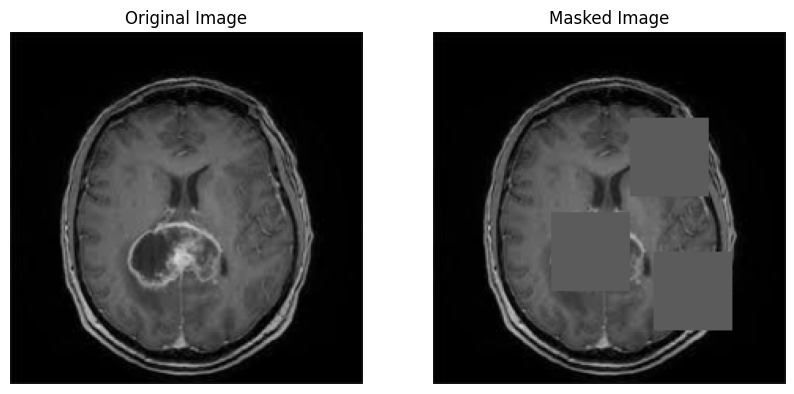

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(91/255.0, 91/255.0, 91/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last3of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(55,125),(115,75),(140,140)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

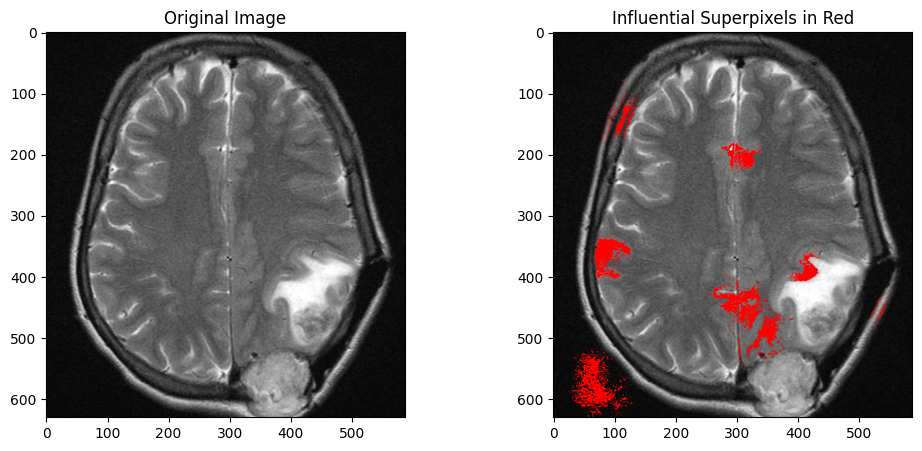

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last4of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Original Prediction: [[0.40649858 0.5935014 ]]
Masked Prediction: [[0.3182593 0.6817407]]


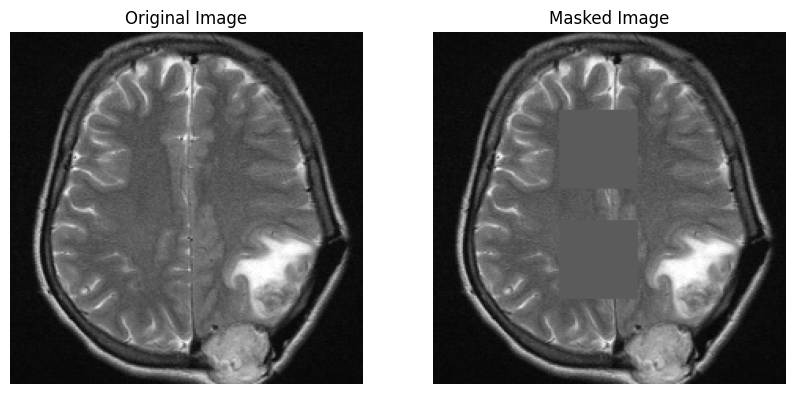

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(91/255.0, 91/255.0, 91/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last4of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(50,80),(120,80)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

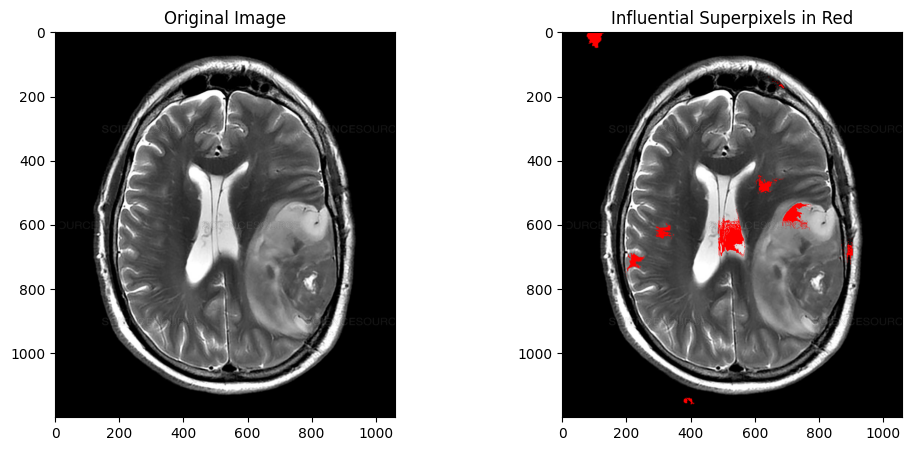

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last5of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.33522055 0.6647795 ]]
Masked Prediction: [[0.27073395 0.72926605]]


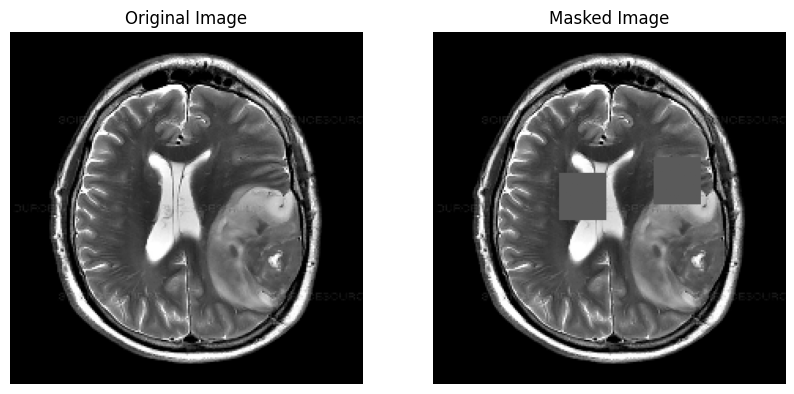

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(90/255.0, 90/255.0, 90/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last5of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(90,80),(80,140)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=30, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

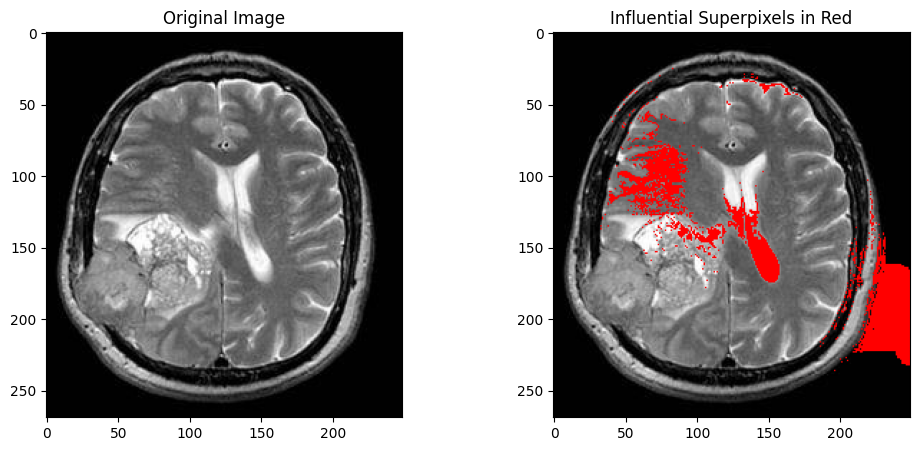

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last6of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.24202906 0.7579709 ]]
Masked Prediction: [[0.2324052 0.7675948]]


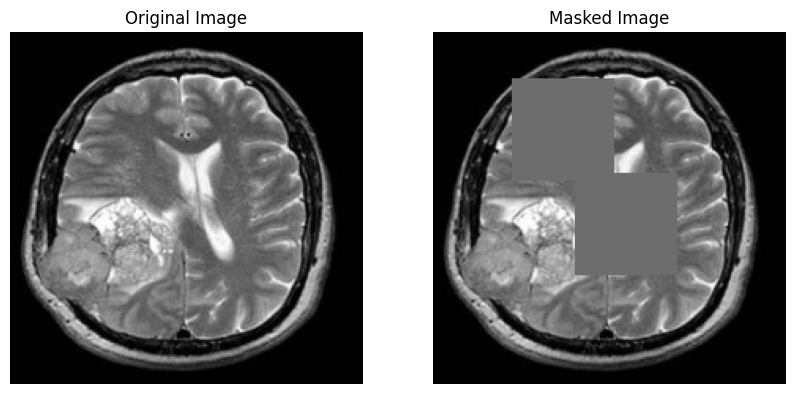

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(109/255.0, 109/255.0, 109/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last6of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(30,50),(90,90)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=65, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

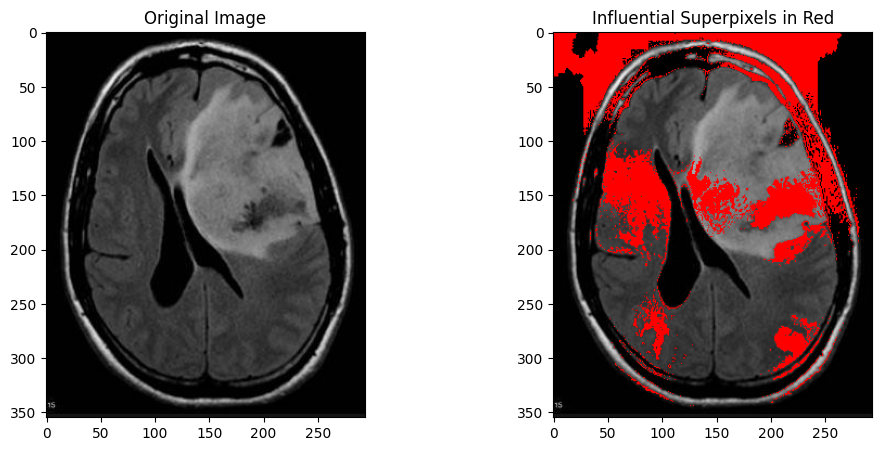

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last7of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step
Original Prediction: [[0.25813273 0.7418673 ]]
Masked Prediction: [[0.4918774 0.5081225]]


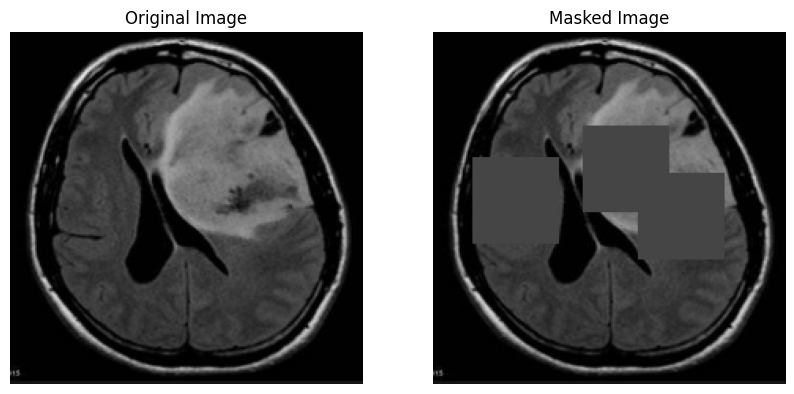

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(69/255.0, 69/255.0, 69/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last7of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(60,95),(90,130),(80,25)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=55, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last8of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


KeyboardInterrupt: 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Prediction: [[0.22676785 0.7732321 ]]
Masked Prediction: [[0.6373834  0.36261663]]


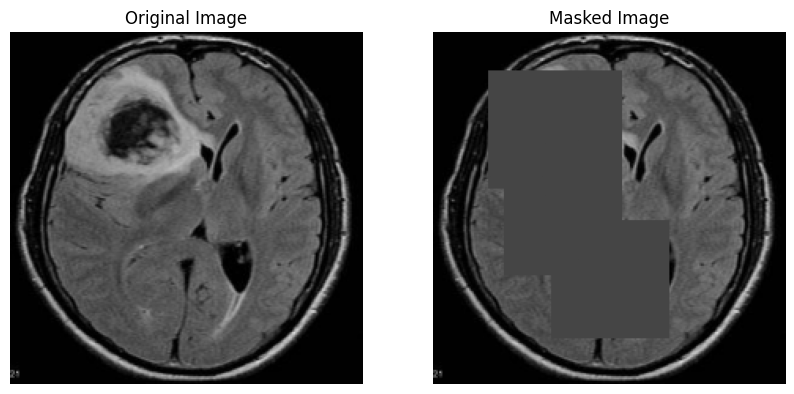

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(69/255.0, 69/255.0, 69/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last8of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(25,35),(25,45),(80,45),(120,75)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=75, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

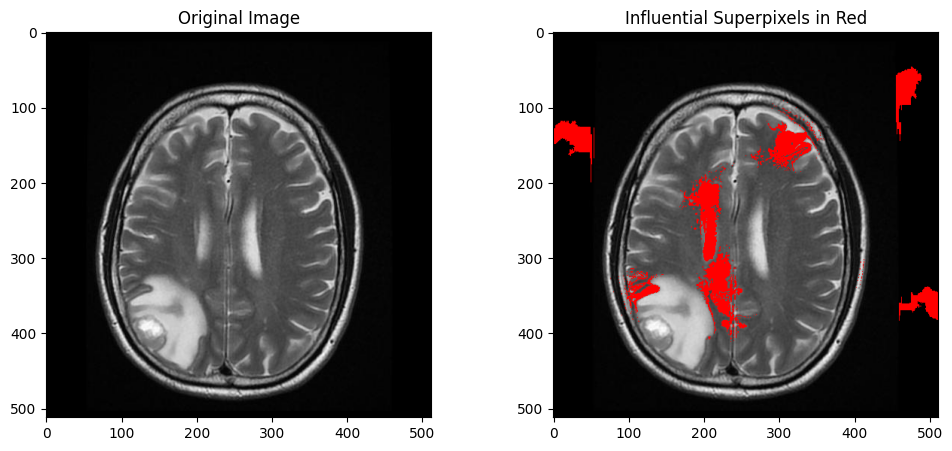

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last9of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 997ms/step
Original Prediction: [[0.5218027  0.47819728]]
Masked Prediction: [[0.6054636 0.3945364]]


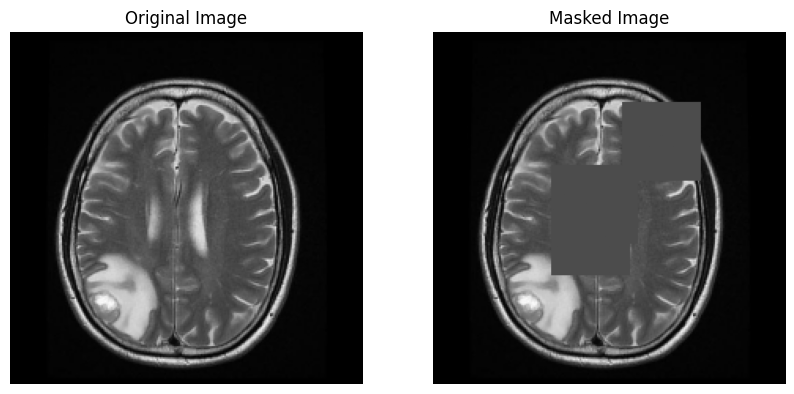

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(76/255.0, 76/255.0, 76/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last9of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(45,120),(85,75),(105,75),(85,80)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=50, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()


  0%|          | 0/2000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

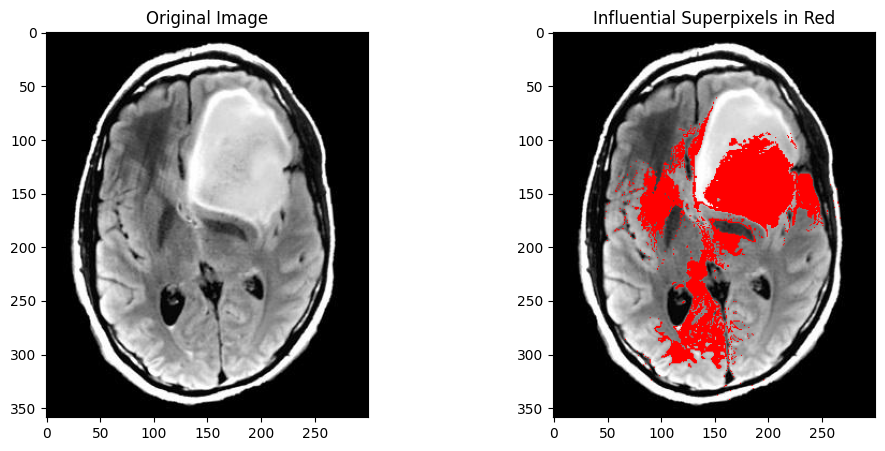

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer

# Load your pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def predict_fn(images):
    images = np.array([cv2.resize(img, (224, 224)) for img in images])
    predictions = model.predict(images)
    return predictions

explainer = LimeImageExplainer()

selected_image_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last10of10.jpg'
selected_image = cv2.imread(selected_image_path)

# Get the explanation for the image
explanation = explainer.explain_instance(selected_image.astype('double'), predict_fn, top_labels=1, num_samples=2000)

# Retrieve the mask for the top 1 label and convert segments into full red color for influential superpixels
label_to_explain = explanation.top_labels[0]
temp, mask = explanation.get_image_and_mask(label_to_explain, positive_only=True, num_features=10, hide_rest=False)

# Create a new image that overlays the important superpixels in red
masked_image = selected_image.copy()
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if mask[i, j]:
            masked_image[i, j] = [0, 0, 255]  # Red color in BGR format

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(selected_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
plt.title('Influential Superpixels in Red')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Prediction: [[0.16756767 0.8324323 ]]
Masked Prediction: [[0.26291257 0.7370874 ]]


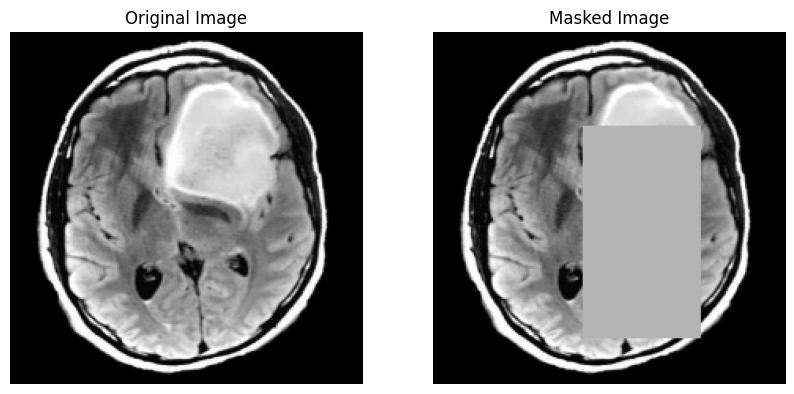

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
model_path = '/content/drive/MyDrive/498R_models/VGG19-Model114.keras'
model = tf.keras.models.load_model(model_path)

def apply_masks(img_array, size=60, positions=[(100, 100)], direction='top_right', mask_color=(180/255.0, 180/255.0, 180/255.0)):
    """ Apply square grey masks to given positions on the image array """
    masked_img = np.copy(img_array)
    for position in positions:
        x, y = position
        if direction == 'top_right':
            x_end = max(0, x - size)
            y_end = max(0, y - size)
            masked_img[x_end:x, y_end:y+size, :] = mask_color
        elif direction == 'bottom_left':
            masked_img[x:x+size, y:y+size, :] = mask_color
        elif direction == 'very_bottom':
            masked_img[-size:, :, :] = mask_color
        # Add more conditions for other directions if needed
    return masked_img

def load_and_preprocess_image(img_path):
    """ Load and preprocess image """
    # Load image
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image at path '{img_path}' not found.")
    # Resize the image
    img = cv2.resize(img, (224, 224))
    # Normalize the image to [0,1]
    img = img.astype('float32') / 255.0
    return img

# Example usage
img_path = '/content/drive/MyDrive/MORE_CF_20(After SUbmission)/last10of10.jpg'
original_img_array = load_and_preprocess_image(img_path)

# Define multiple mask positions
mask_positions = [(60,95),(120,95)]   # change positions of the masks

masked_img_array = apply_masks(original_img_array, size=75, positions=mask_positions, direction='bottom_left')
masked_img_array_expanded = np.expand_dims(masked_img_array, axis=0)
original_img_array_expanded = np.expand_dims(original_img_array, axis=0)

original_pred = model.predict(original_img_array_expanded)
masked_pred = model.predict(masked_img_array_expanded)

print("Original Prediction:", original_pred)
print("Masked Prediction:", masked_pred)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_img_array)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_img_array)
plt.title('Masked Image')
plt.axis('off')
plt.show()
